In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import featureman.gen_data as man
from sklearn.cluster import SpectralClustering
import pickle
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
sae_dict = torch.load("sae_model_small_batch_2025-08-07_00-27-27.pth", map_location=device)
sae = man.BatchedSAE_Updated(input_dim=512, n_models=5, width_ratio=4).to(device)
sae.load_state_dict(sae_dict)

model_dict = torch.load("modular_arithmetic_model.pth", map_location=device)
model = man.OneLayerTransformer(p=113, d_model=128, nheads=4).to(device)
model.load_state_dict(model_dict)

<All keys matched successfully>

In [3]:
torch.manual_seed(1337)
# generate combination of all inputs a and b range (113)
a = np.arange(113)
b = np.arange(113)
# generate inputs for the model
inputs = np.array([[a_i, 113, b_i, 114] for a_i in a for b_i in b])
inputs = torch.tensor(inputs).to(device)  # Add batch dimension
print(inputs.shape)
logits, activations = model(inputs, return_activations=True)
activations_data = activations[:, -1, :].detach()
batched_acts = activations_data.unsqueeze(0).repeat(5, 1, 1).to(device)
del model, model_dict
print(batched_acts.shape)

torch.Size([12769, 4])
torch.Size([5, 12769, 512])


In [4]:
import pickle

decoder = sae.W_d[3].detach()
print(decoder.shape)
_, _, feat_acts, _ = sae(batched_acts)
features = feat_acts[3].detach()
with open("sae_clusters_small_batch_15.pkl", "rb") as f:
    clusters = pickle.load(f)
clusters = [c for c in clusters if len(c) > 1]  # Filter out clusters with only one element
clusters = sorted(clusters, key=lambda x: len(x), reverse=True)  # Sort by size
print(features.shape)


torch.Size([2048, 512])
torch.Size([12769, 2048])


In [5]:
colors_b = inputs[:, 2].detach().cpu().numpy()

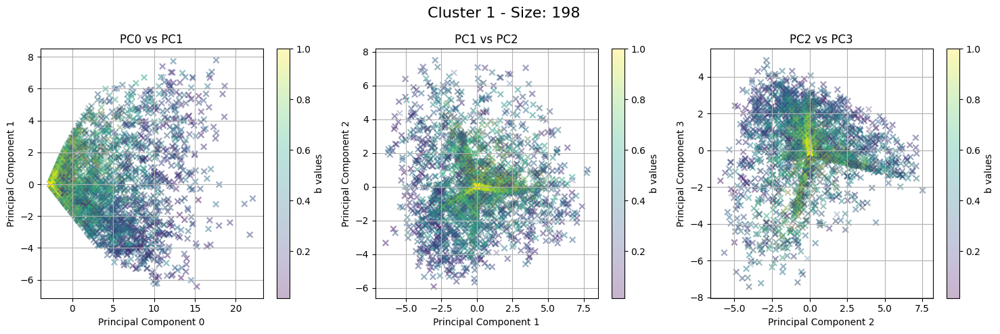

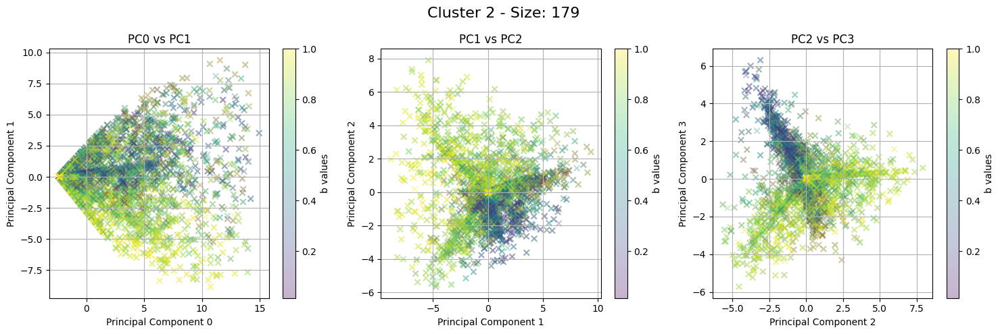

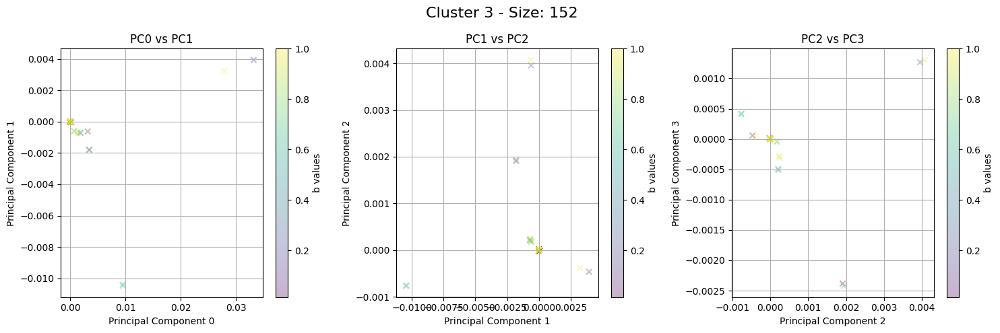

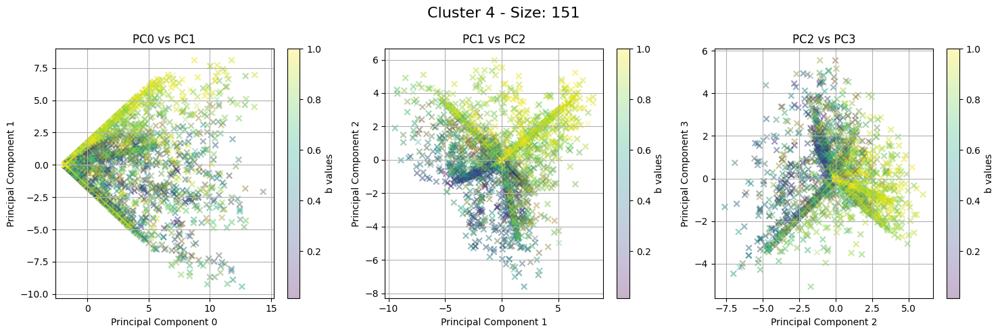

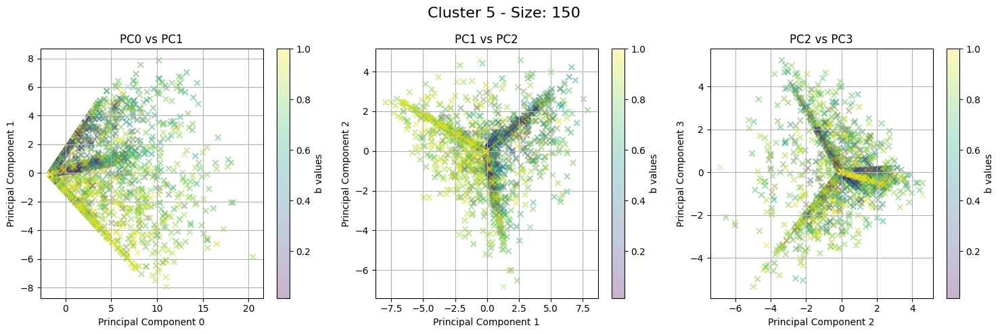

...

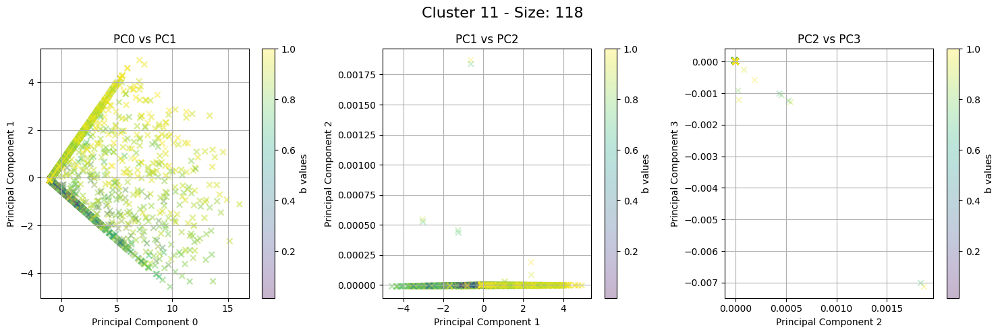

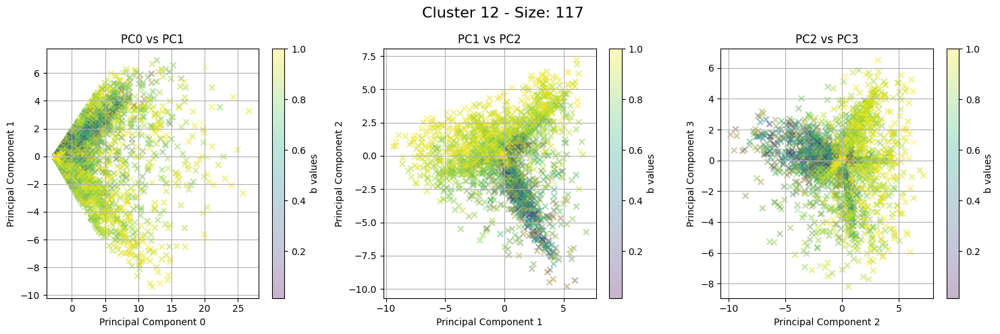

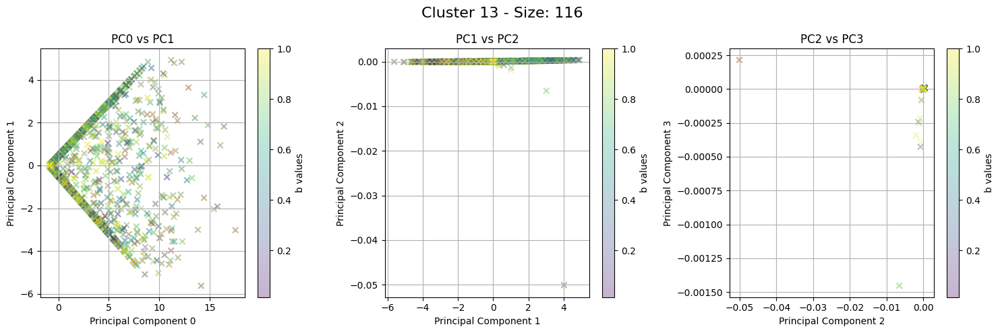

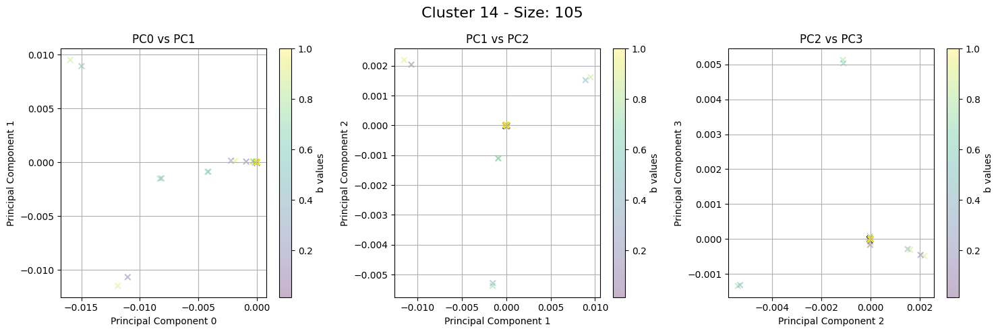

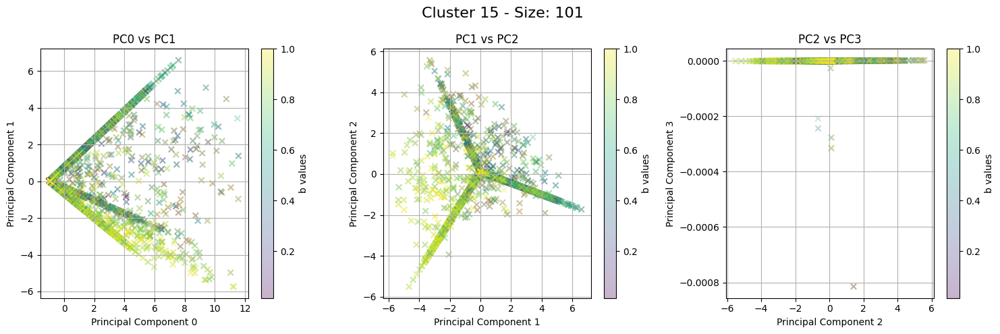

In [6]:
# 0 if inputs[:, 0] is even else 1
results_a = abs(np.cos(6*np.pi*(inputs[:, 0].detach().cpu().numpy())/113))
results_b = abs(np.cos(6*np.pi*(inputs[:, 2].detach().cpu().numpy())/113))
results_c = abs(np.sin(6*np.pi*(inputs[:, 0].detach().cpu().numpy() + inputs[:, 2].detach().cpu().numpy())/113))

just_a = inputs[:, 0].detach().cpu().numpy()

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

for i in range(len(clusters)):
    features_interest = features[:, clusters[i]]
    decoder_interest = decoder[clusters[i], :]
    reconstructions = features_interest @ decoder_interest
    reconstructions.shape

    pca = PCA()
    output_pca = pca.fit_transform(reconstructions.detach().cpu().numpy())

    plt.figure(figsize=(15, 5))

    # Subplot 1: PC0 vs PC1
    plt.subplot(1, 3, 1)
    scatter1 = plt.scatter(output_pca[:, 0][:], output_pca[:, 1][:], marker='x', c=results_a[:], alpha=0.3, cmap='viridis')
    plt.title("PC0 vs PC1")
    plt.xlabel("Principal Component 0")
    plt.ylabel("Principal Component 1")
    plt.grid()
    plt.colorbar(scatter1, label='b values')

    # Subplot 2: PC1 vs PC2
    plt.subplot(1, 3, 2)
    scatter2 = plt.scatter(output_pca[:, 1][:], output_pca[:, 2][:], marker='x', c=results_a[:], alpha=0.3, cmap='viridis')
    plt.title("PC1 vs PC2")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid()
    plt.colorbar(scatter2, label='b values')

    # Subplot 3: PC0 vs PC2 (corrected from your original)
    plt.subplot(1, 3, 3)
    scatter3 = plt.scatter(output_pca[:, 2][:], output_pca[:, 3][:], marker='x', c=results_a[:], alpha=0.3, cmap='viridis')
    plt.title("PC2 vs PC3")  # Fixed title
    plt.xlabel("Principal Component 2")  # Fixed label
    plt.ylabel("Principal Component 3")
    plt.grid()
    plt.colorbar(scatter3, label='b values')

    #sup title
    plt.suptitle(f"Cluster {i + 1} - Size: {len(clusters[i])}", fontsize=16)

    plt.tight_layout()
    plt.show()

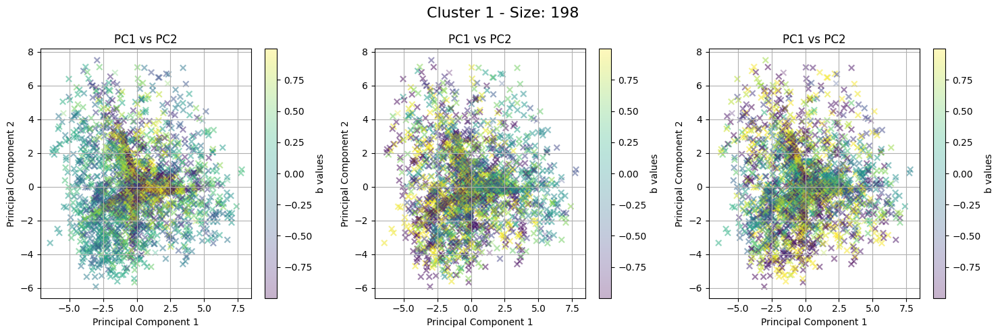

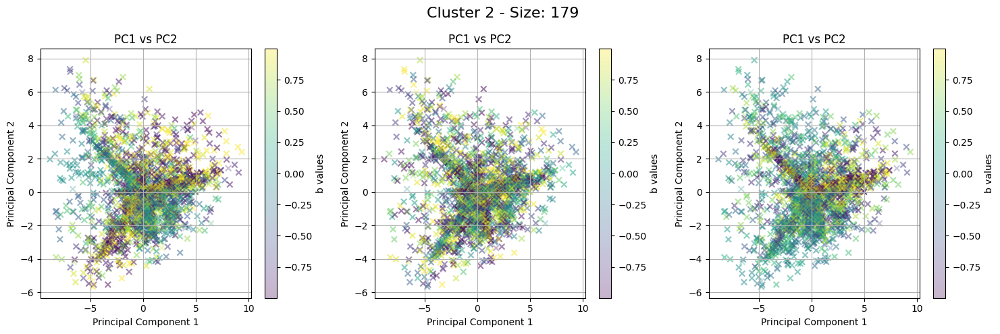

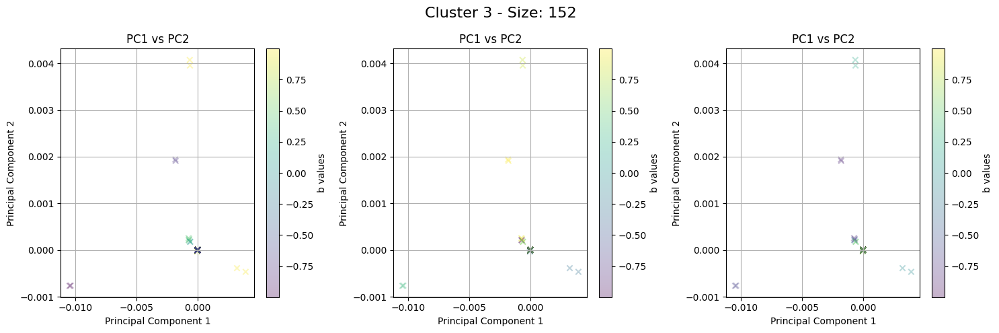

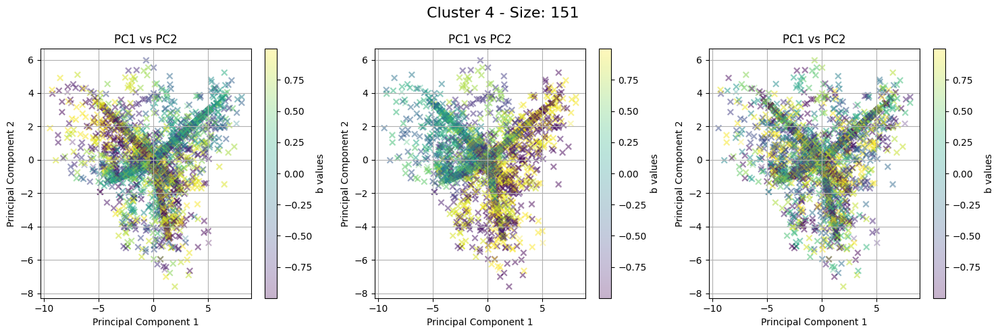

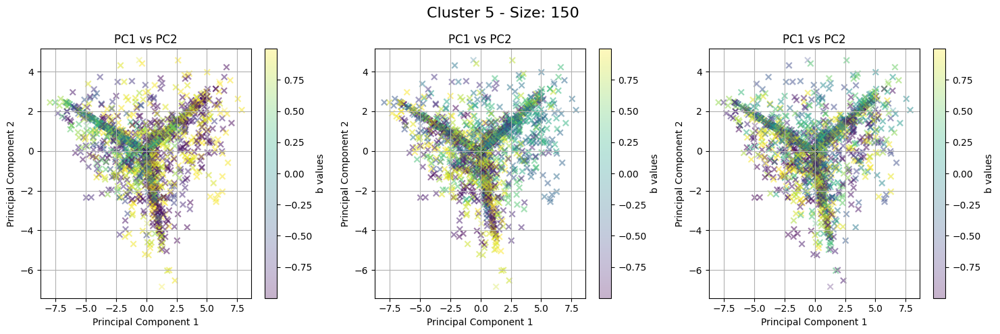

...

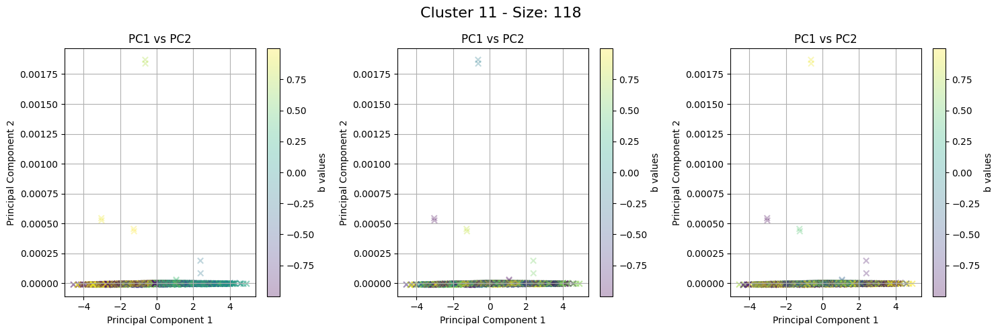

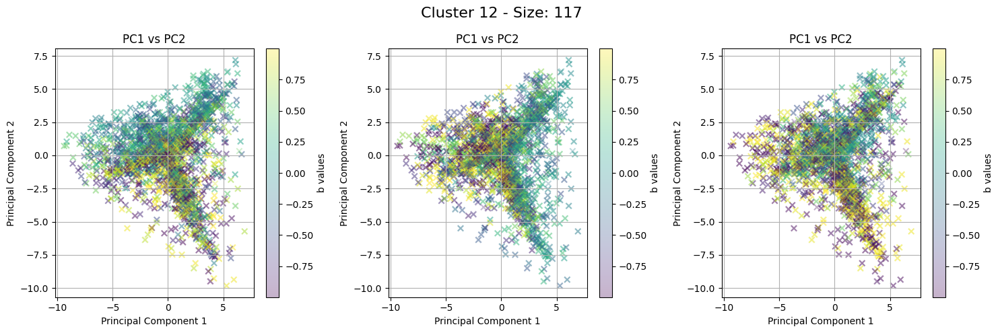

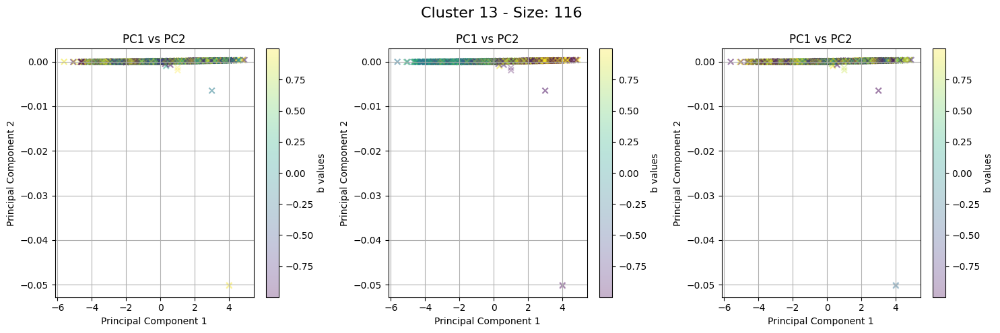

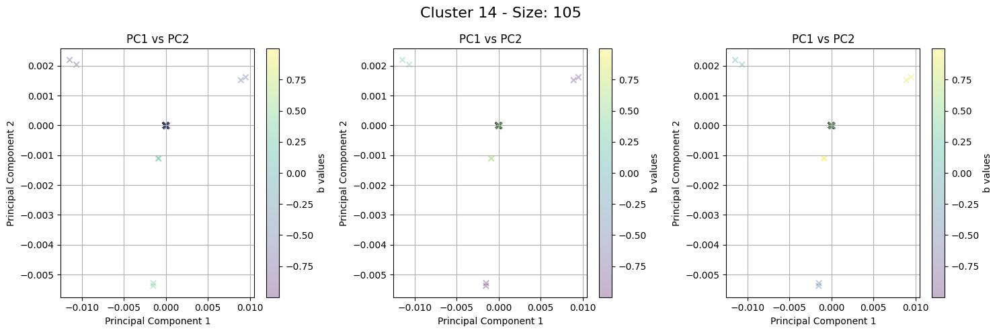

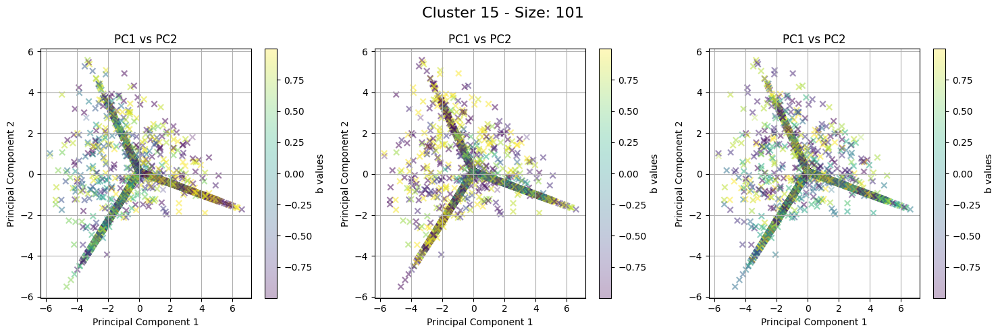

In [19]:
inputs_d = inputs.detach().cpu().numpy()
# 0 if inputs[:, 0] is even else 1
results_a_first_k = np.sin(6*np.pi*(inputs_d[:, 0] + inputs_d[:, 2])/113)
results_a_second_k = np.sin(44*np.pi*(inputs_d[:, 0] + inputs_d[:,2])/113)
results_a_third_k = np.sin(54*np.pi*(inputs_d[:, 0] + inputs_d[:,2])/113)

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

for i in range(len(clusters)):
    features_interest = features[:, clusters[i]]
    decoder_interest = decoder[clusters[i], :]
    reconstructions = features_interest @ decoder_interest
    reconstructions.shape

    pca = PCA()
    output_pca = pca.fit_transform(reconstructions.detach().cpu().numpy())

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    scatter2 = plt.scatter(output_pca[:, 1][:], output_pca[:, 2][:], marker='x', c=results_a_first_k, alpha=0.3, cmap='viridis')
    plt.title("PC1 vs PC2")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid()
    plt.colorbar(scatter2, label='b values')

    plt.subplot(1, 3, 2)
    scatter2 = plt.scatter(output_pca[:, 1][:], output_pca[:, 2][:], marker='x', c=results_a_second_k, alpha=0.3, cmap='viridis')
    plt.title("PC1 vs PC2")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid()
    plt.colorbar(scatter2, label='b values')

    plt.subplot(1, 3, 3)
    scatter2 = plt.scatter(output_pca[:, 1][:], output_pca[:, 2][:], marker='x', c=results_a_third_k, alpha=0.3, cmap='viridis')
    plt.title("PC1 vs PC2")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid()
    plt.colorbar(scatter2, label='b values')


    #sup title
    plt.suptitle(f"Cluster {i + 1} - Size: {len(clusters[i])}", fontsize=16)

    plt.tight_layout()
    plt.show()